In [1]:
import numpy as np
import logging
import joblib
import matplotlib.pyplot as plt

from matplotlib.patches import Rectangle, ConnectionPatch
from functools import partial
from os.path import join, isfile

from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

from cvdatasets.annotations import AnnotationType
from cvdatasets.dataset import AnnotationsReadMixin
from cvdatasets.dataset import PartMixin
from cvdatasets.dataset import IteratorMixin
from cvdatasets.utils import new_iterator


from chainer_addons.models import ModelType
from chainer_addons.models import PrepareType
from chainer_addons.links.pooling import PoolingType

import chainer
from chainer.dataset.convert import concat_examples
from chainer.cuda import to_cpu

chainer.__version__

'4.2.0'

In [2]:
class Args(object):
    data                  = "/home/korsch/Data/info.yml"
    dataset               = "CUB200"
    parts                 = "L1_pred"
    model_type            = "inception"
    
    # weights               = "rmsprop.LR1e-3.from_scratch.g_avg_pooling/model_final.npz"
    # weights               = "sgd.LR1e-2.from_scratch.g_avg_pooling/model_final.npz"
    # weights               = "rmsprop.LR1e-4.step2.g_avg_pooling/ft_model_epoch050/model_final.npz"
    weights               = None #"rmsprop.g_avg_pooling/model.inat.ckpt/model_final.npz"
    pooling               = PoolingType.G_AVG.name
    prepare_type          = PrepareType.MODEL.name
    clf_outputs           = "/home/korsch/Repos/PhD/00_SVM_Baseline/.out"
    part_clf              = f"{clf_outputs}/clf_svm_{dataset}_{parts}.{model_type}_all_parts.npz"
    swap_channels         = True
    input_size            = 427
    label_shift           = 0
    
    cls                   = 1
    
    n_jobs                = 1
    
    
    channel_axis          = 1
    shuffle               = False
    
    gpu                   = [0]
    batch_size            = 10

args = Args()
GPU = args.gpu[0]

logging.basicConfig(
    format='%(message)s',
    level=logging.INFO
)

In [3]:
assert isfile(args.part_clf), f"Could not find the classifier: \"{args.part_clf}\"!"

clf = joblib.load(args.part_clf)
logging.info(f"Loadded classifier {clf} from \n\"{args.part_clf}\"")

Loadded classifier LinearSVC(C=0.1, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=200,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0) from 
"/home/korsch/Repos/PhD/00_SVM_Baseline/.out/clf_svm_CUB200_L1_pred.inception_all_parts.npz"


In [4]:
annot_cls = AnnotationType.get(args.dataset).value
part_key = f"{args.dataset}_{args.parts}"
annot = annot_cls(args.data, part_key,
                  feature_model=args.model_type)


data_info = annot.info
model_info = data_info.MODELS[args.model_type]
part_info = data_info.PARTS[part_key]

logging.info(f"Loaded {part_key} annotations")

Loaded CUB200_L1_pred annotations


In [5]:
_dataset = partial(annot.new_dataset)

train, test = map(_dataset, ["train", "test"])

logging.info(f"Loaded {len(train)} training and {len(test)} test samples")
logging.info(f"Loaded {train.features.shape} training and {test.features.shape} test features")

Loaded 5994 training and 5794 test samples
Loaded (5994, 5, 2048) training and (5794, 5, 2048) test features


In [6]:
def _invoker(clf, data, method, no_labels=False, global_only=False):
    func = getattr(clf, method)
    if global_only:
        X = data.features[:, -1, :]
    else:
        X = data.features.reshape(len(data), -1)
    if no_labels:
        return func(X)
    else:
        return func(X, data.labels)

score = partial(_invoker, method="score")
fit = partial(_invoker, method="fit")
predict = partial(_invoker, method="predict", no_labels=True)

In [7]:
print(score(clf, train), score(clf, test))

1.0 0.8860890576458406


In [21]:
DUMP = True
load_key = f"global_svm_{part_key}.npz"

if DUMP and isfile(load_key):
    logging.info(f"Loading global SVM from \"{load_key}\"")
    _clf = joblib.load(load_key)
else:
    logging.info("Train new global SVM")
    _clf = LinearSVC()
    %time fit(_clf, train, global_only=True)
    if DUMP:
        logging.info(f"Saving SVM to \"{load_key}\"")
        joblib.dump(_clf, load_key)
    

Train new global SVM
Saving SVM to "global_svm_CUB200_L1_pred.npz"


CPU times: user 38.4 s, sys: 71.2 ms, total: 38.4 s
Wall time: 38.4 s


In [22]:
print(score(_clf, train, global_only=True), score(_clf, test, global_only=True))

1.0 0.8848809112875389


In [23]:
y = test.labels

part_y = predict(clf, test)
glob_y = predict(_clf, test, global_only=True)

part_pred = part_y == y
glob_pred = glob_y == y

In [24]:
confusion_matrix(y, part_y)

array([[28,  0,  0, ...,  0,  0,  0],
       [ 0, 26,  0, ...,  0,  0,  0],
       [ 0,  0, 27, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ..., 26,  0,  0],
       [ 0,  0,  0, ...,  0, 28,  0],
       [ 0,  0,  0, ...,  0,  0, 30]])

In [25]:
def plot_conf_matrix(pred, 
                     c0=50, 
                     c1=75,
                     C="red",
                     linewidth=2,
                     **kwargs):
    mat = np.log(confusion_matrix(y, pred)+1)

    fig, axs = plt.subplots(1,2, **kwargs)
    

    axs[0].imshow(mat)
    axs[0].get_xaxis().set_ticks([])
    axs[0].get_yaxis().set_ticks([])

    line_axis = fig.add_axes((0.1,0.2,.8,.6))
    line_axis.axis('off')


    axs[0].add_patch(Rectangle(
        (c0,c0), 
        c1-c0, c1-c0, 
        fill=False, 
        color=C,
        linewidth=linewidth,
    ))

    axs[1].imshow(mat[c0:c1, c0:c1])
    axs[1].get_xaxis().set_ticks([])
    axs[1].get_yaxis().set_ticks([])


    con = ConnectionPatch(
        xyA=(c1, c0), 
        xyB=(-0.5, -0.5),
        coordsA="data", coordsB="data",
        axesA=axs[0], axesB=axs[1],
        arrowstyle="-", clip_on=False,
        color=C, linewidth=linewidth,
    )
    line_axis.add_artist(con)

    con = ConnectionPatch(
        xyA=(c1, c1), 
        xyB=(-0.5, c1-c0-0.5),
        coordsA="data", coordsB="data",
        axesA=axs[0], axesB=axs[1],
        arrowstyle="-", clip_on=False,
        color=C, linewidth=linewidth,
    )
    line_axis.add_artist(con)

    plt.show()

# Global-Based Confusion Matrix

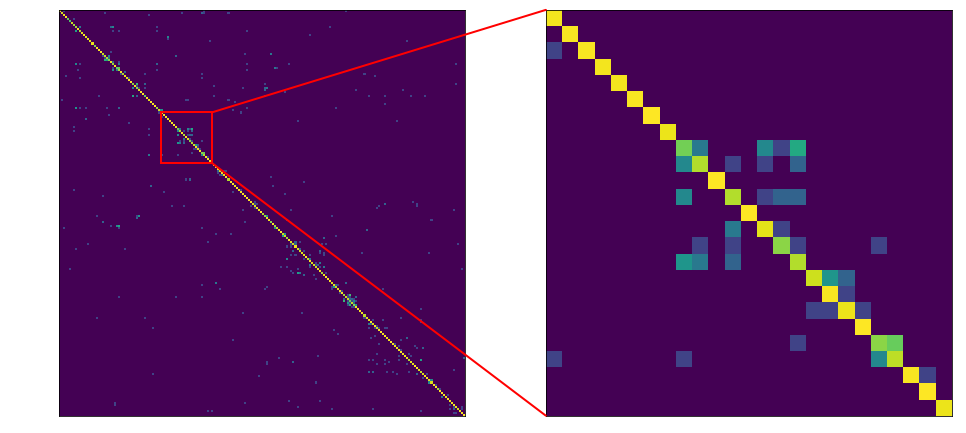

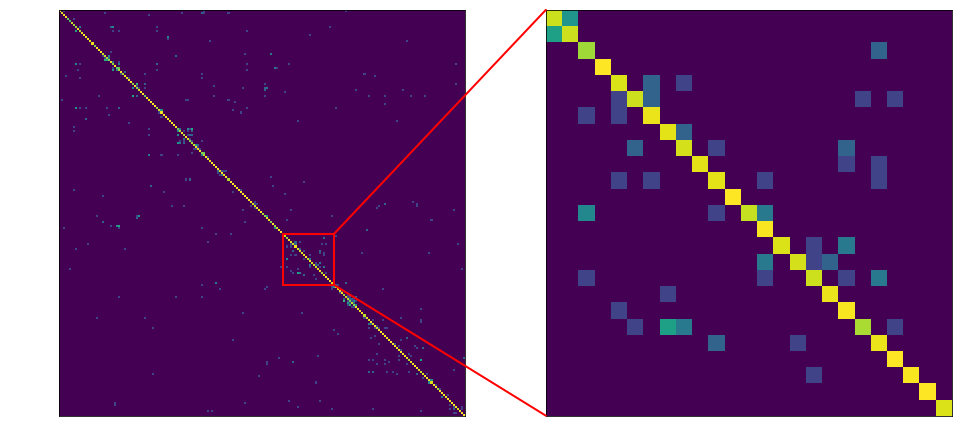

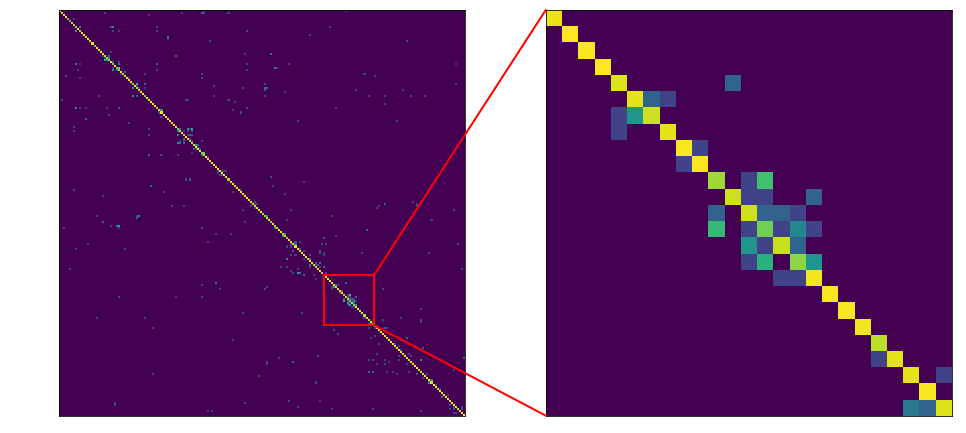

In [26]:
plot_conf_matrix(glob_y, 50, 75, figsize=(16, 9)) # classes 59 - 66
plot_conf_matrix(glob_y, 110, 135, figsize=(16, 9))
plot_conf_matrix(glob_y, 130, 155, figsize=(16, 9))

# Part-Based Confusion Matrix

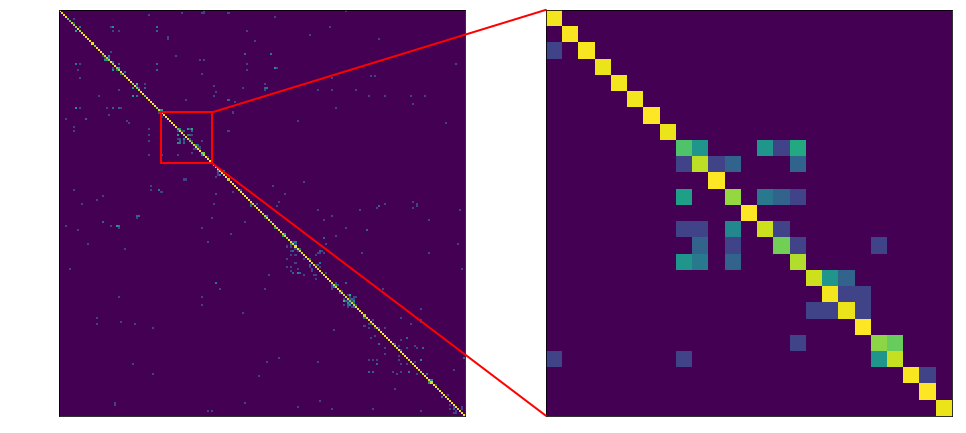

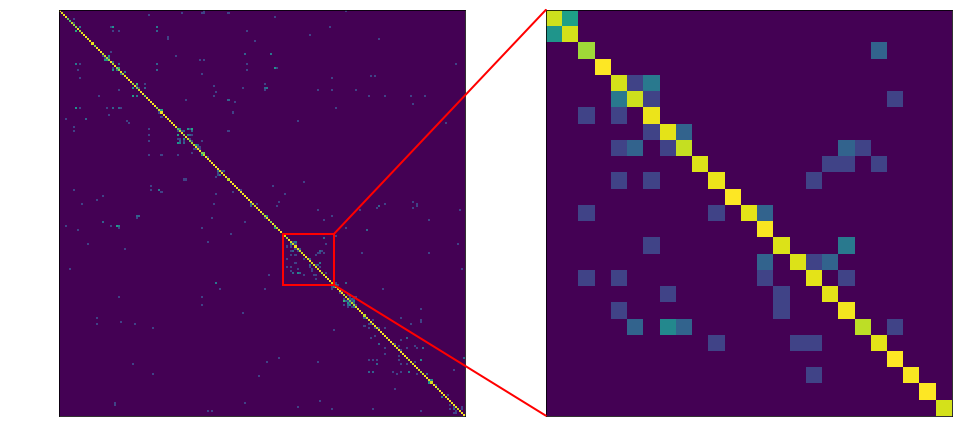

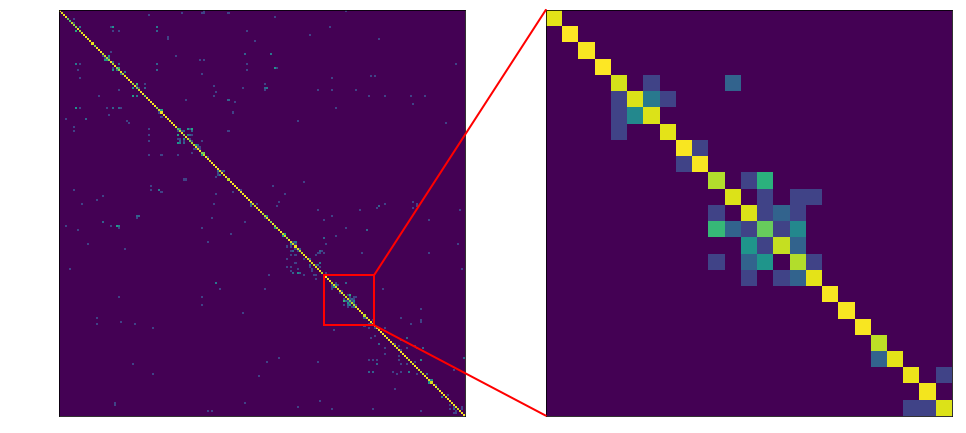

In [27]:
plot_conf_matrix(part_y, 50, 75, figsize=(16, 9))
plot_conf_matrix(part_y, 110, 135, figsize=(16, 9))
plot_conf_matrix(part_y, 130, 155, figsize=(16, 9))

In [28]:
part_and_not_glob = np.logical_and(part_pred, np.logical_not(glob_pred))
glob_and_not_part = np.logical_and(glob_pred, np.logical_not(part_pred))

print(part_and_not_glob.sum())
print(glob_and_not_part.sum())

96
89


In [29]:
def plot_im_and_parts(idxs):

    for idx in idxs:
        im, parts, lab = test[idx]
        n_parts = len(parts._parts)
        
        n_rows = int(np.ceil(np.sqrt(n_parts)))
        n_cols = int(np.ceil(n_parts / n_rows))
                     

        glob_p = _clf.predict(test.features[idx, -1].reshape(1, -1))[0]
        part_p = clf.predict(test.features[idx].reshape(1, -1))[0]

        fig, ax = plt.subplots(figsize=(16,9))

        ax.axis("off")
        ax.imshow(im)
        ax.set_title(f"GT: {lab}, global prediction: {glob_p}, part prediction: {part_p}")
        parts.plot(im=im, ax=ax, ratio=0, linestyle="-")

        fig, axs = plt.subplots(n_rows, n_cols, figsize=(16,9))
        part_crops = parts.visible_crops(im, ratio=0) # here ratio is not used
        for i, crop in enumerate(part_crops):
            _i = np.unravel_index(i, axs.shape)
            ax = axs[_i]
            ax.imshow(crop)
            ax.axis("off")
            ax.set_title(f"Part #{i}")
    
        for i in range(n_parts, n_rows*n_cols):
            _i = np.unravel_index(i, axs.shape)
            axs[_i].axis("off")
            
        plt.show()
        plt.close()

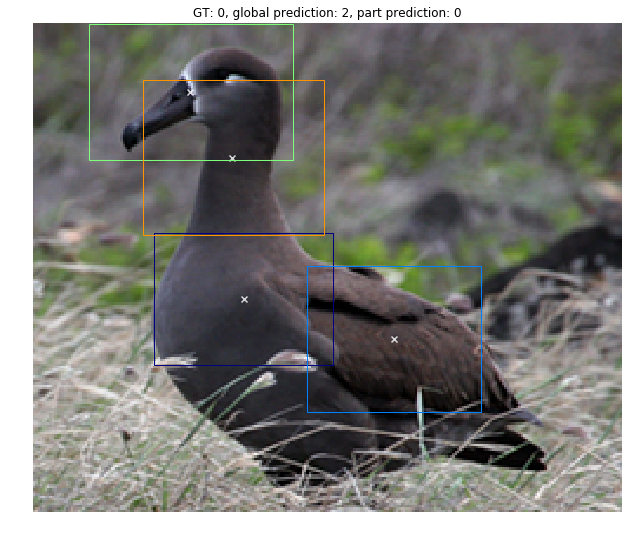

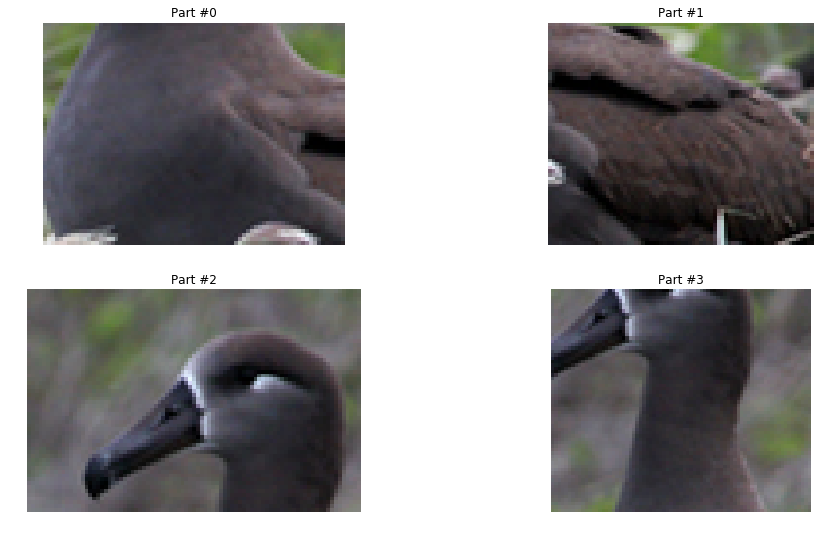

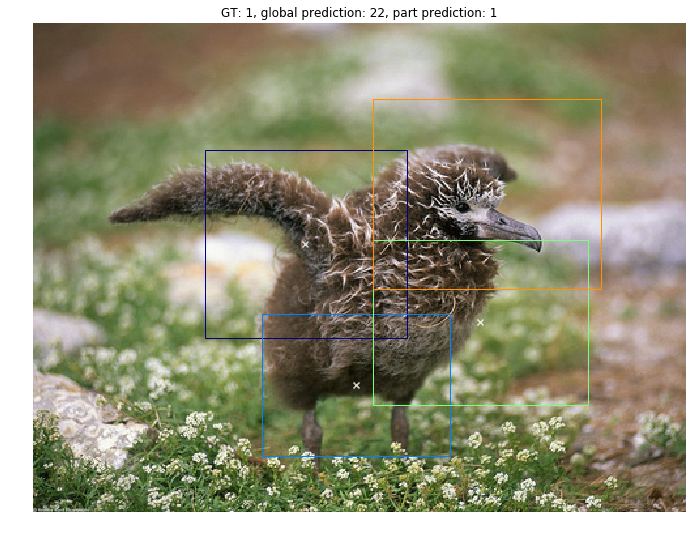

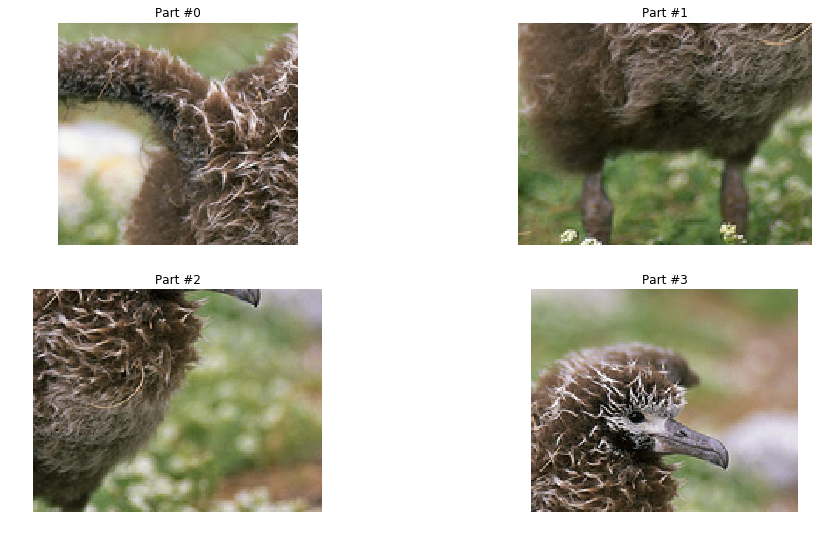

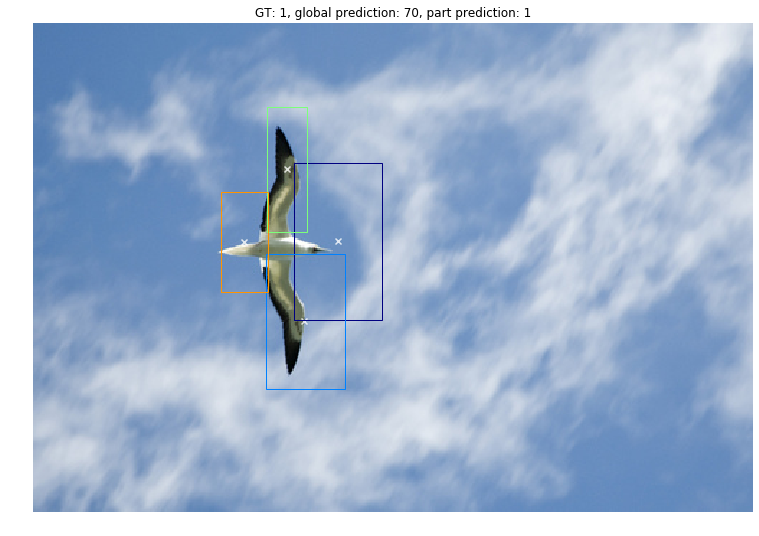

...

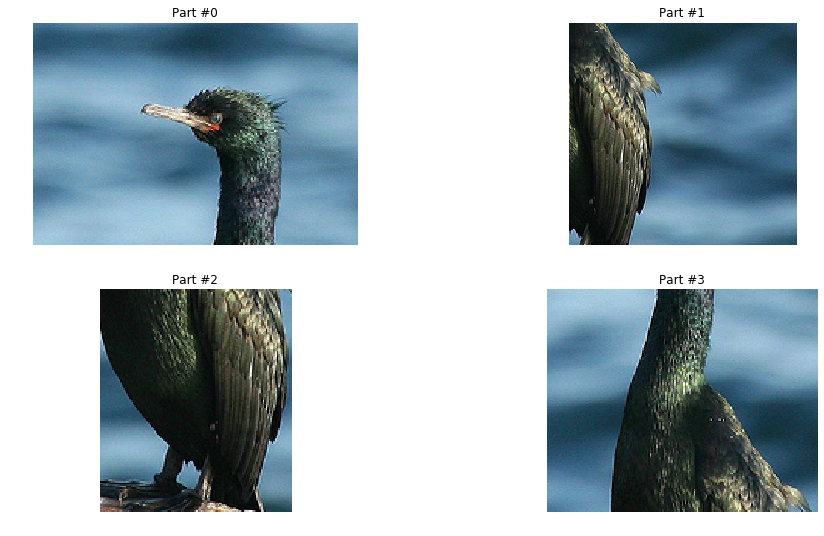

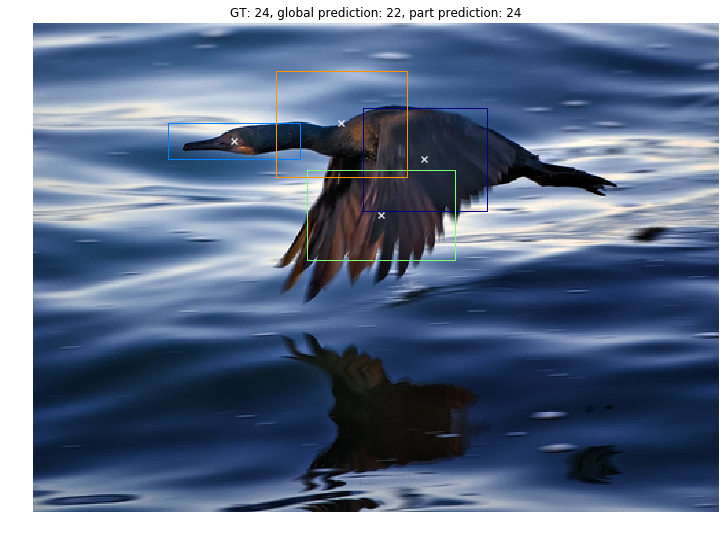

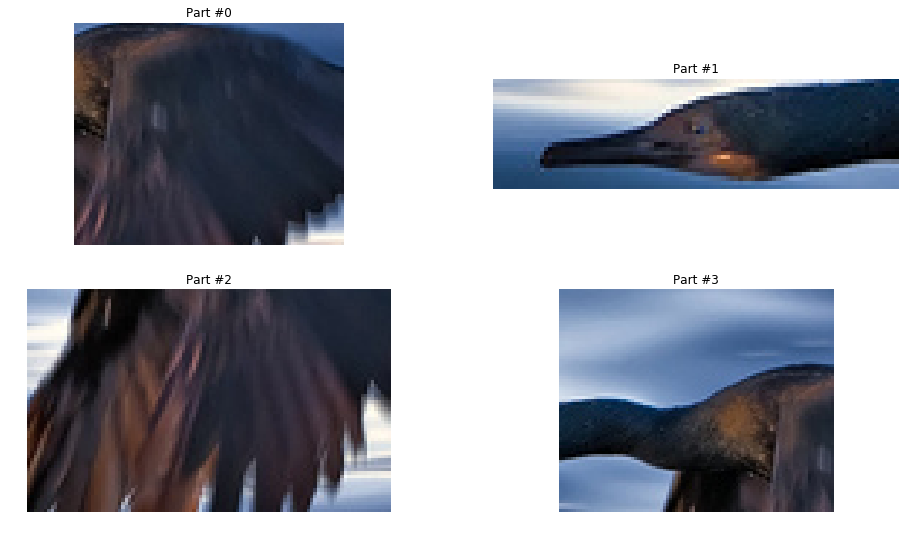

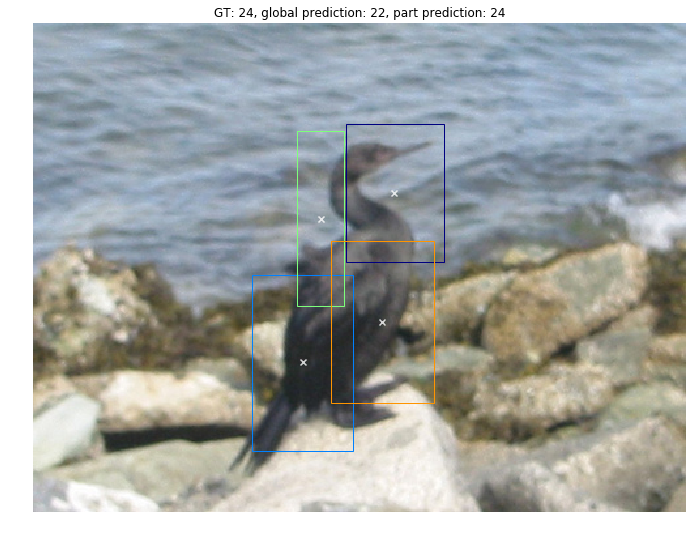

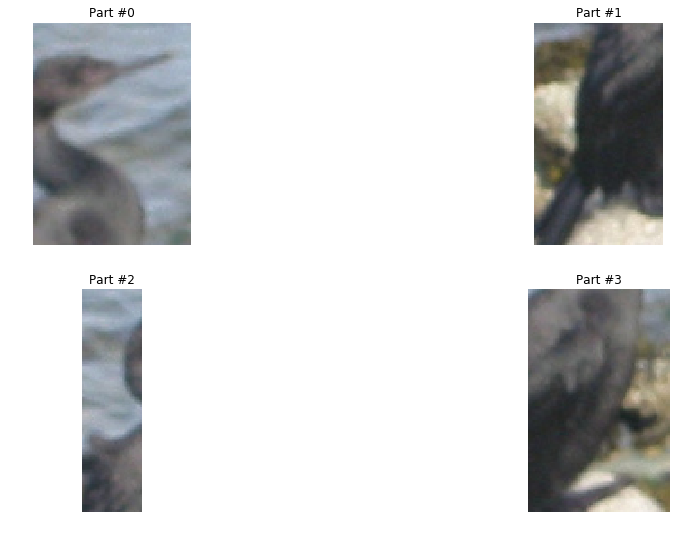

In [30]:
idxs0 = np.where(part_and_not_glob)[0][:10]
plot_im_and_parts(idxs0)

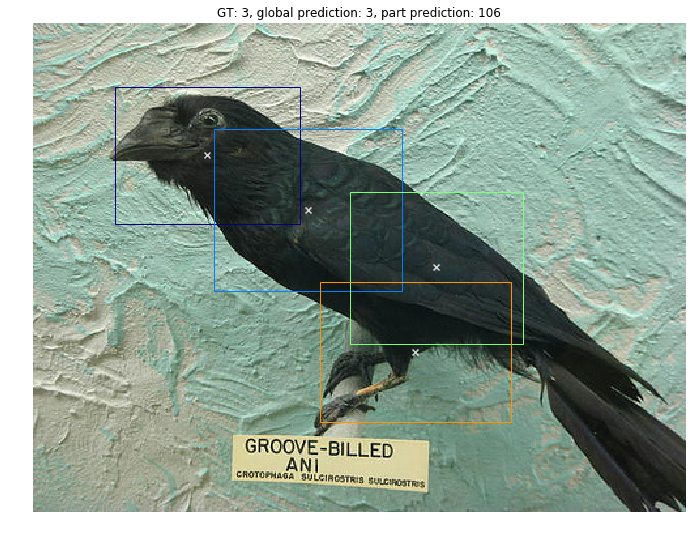

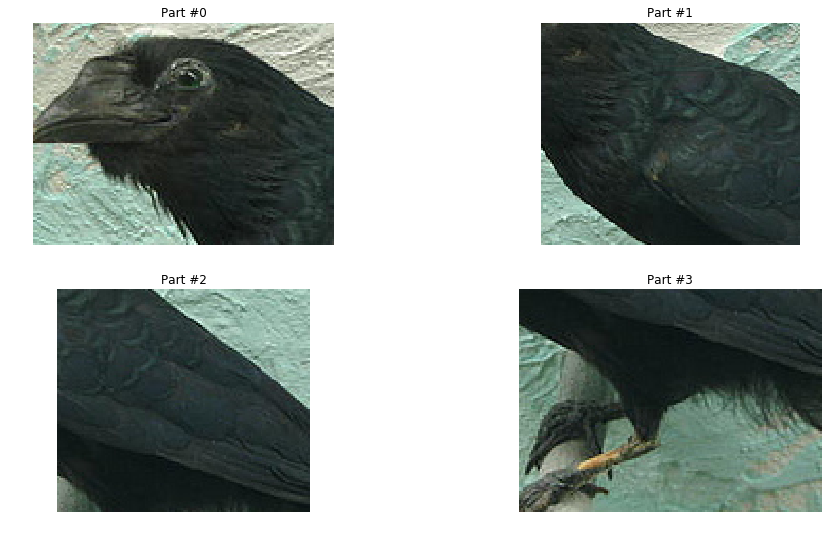

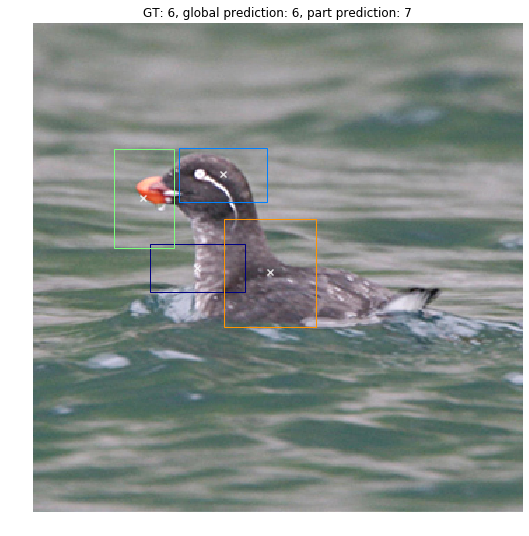

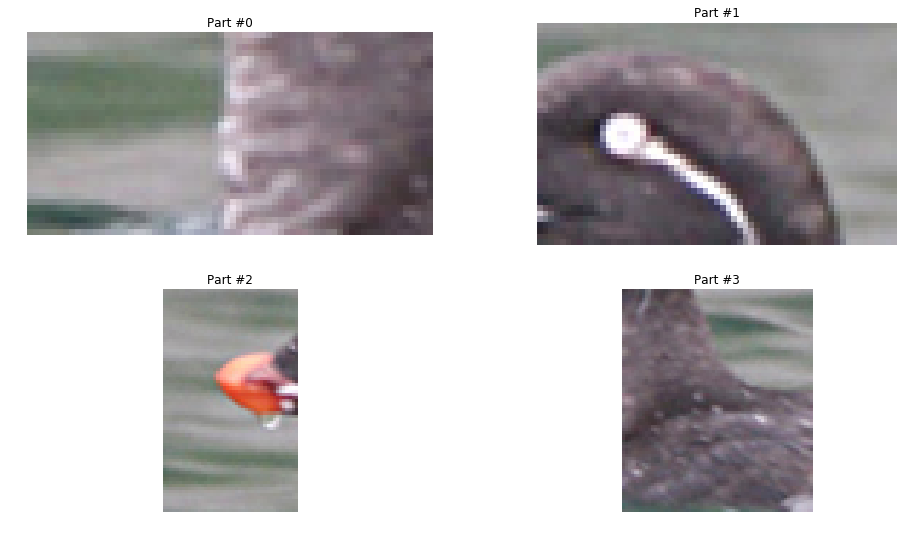

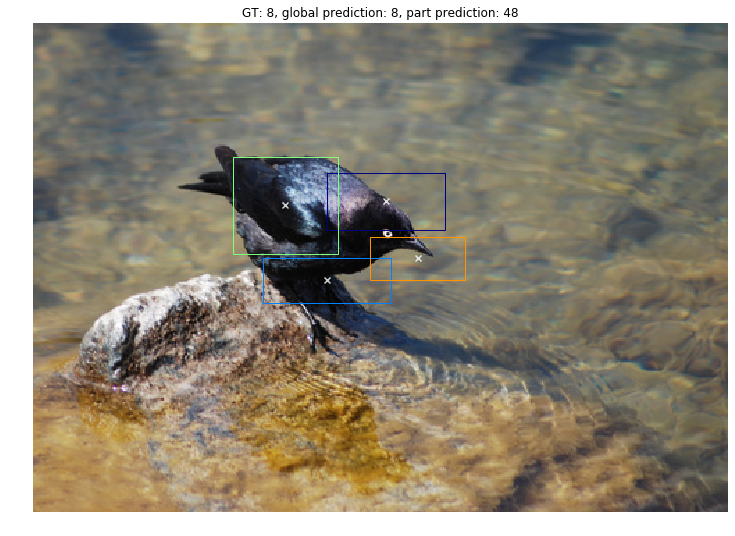

...

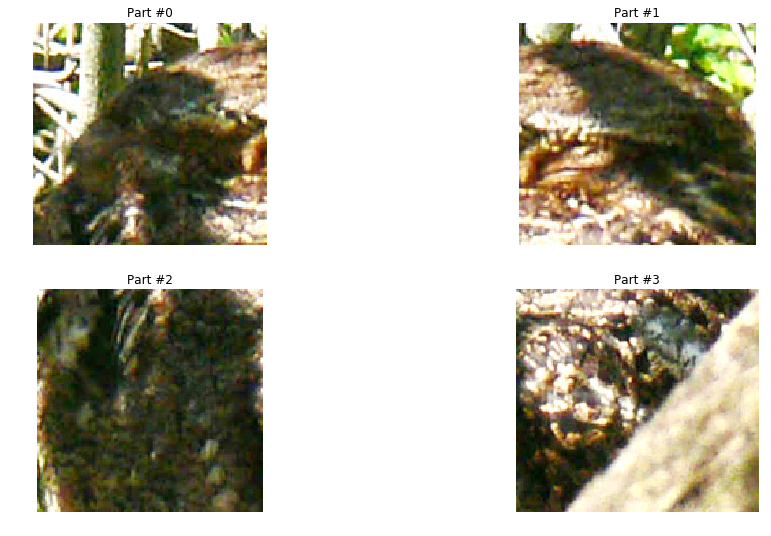

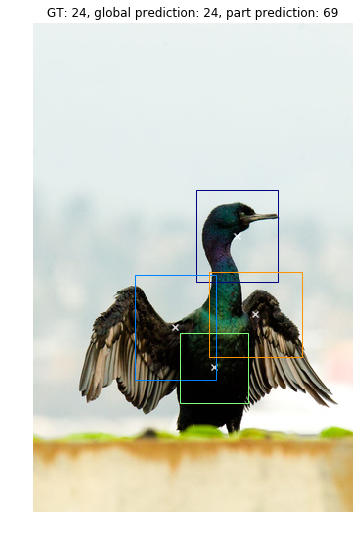

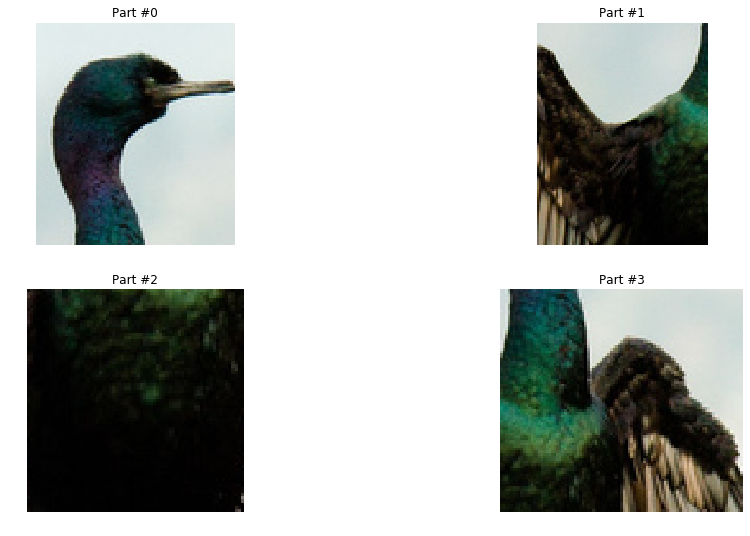

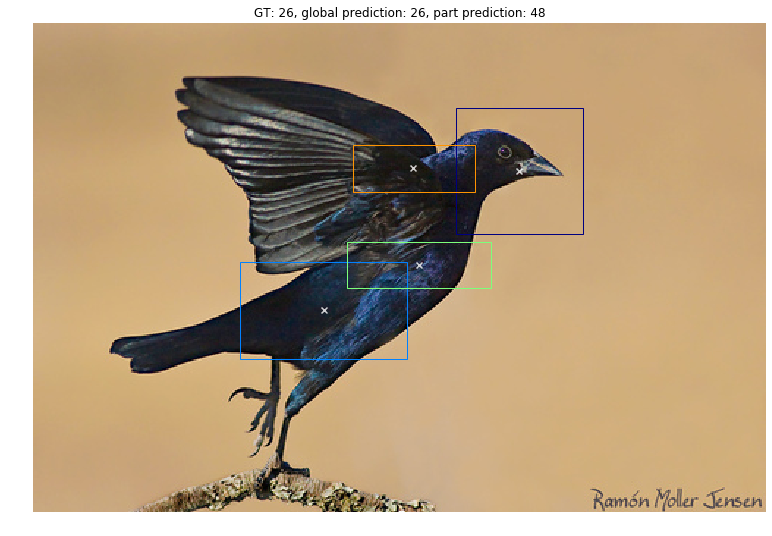

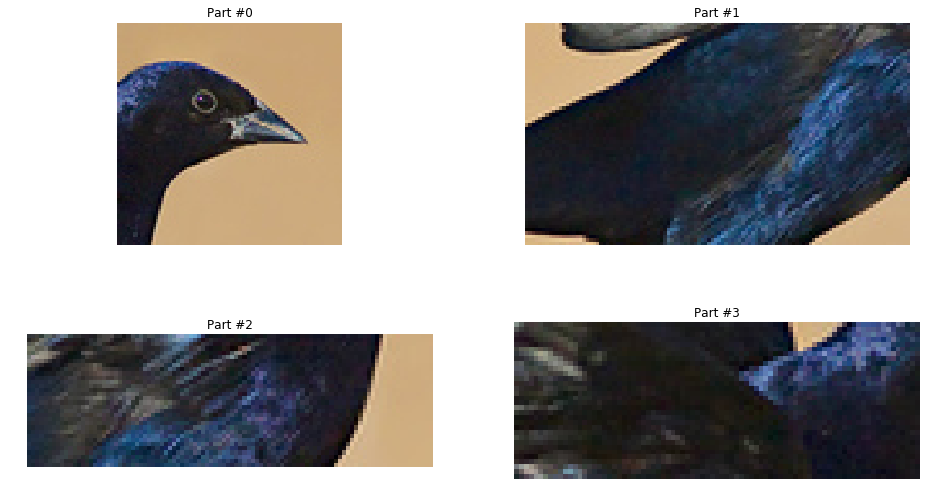

In [31]:
idxs1 = np.where(glob_and_not_part)[0][:10]
plot_im_and_parts(idxs1)